# Übung 4: Erdbeeren Low-Resolution
**2er-Gruppenübung** -  Abgabe: 13.06.2025, 23:59 Uhr

Abgabe bitte nur in __eines__ euer Repositories.

**Namen:** <br> 
*Prakunj Pratap Singh*<br>
*Helia Moradi* <br>
**Bearbeitungszeit:** *96 hours*

## Aufgabe 9: Erdbeertheorie ($\sum$ 12P)
In dieser Aufgabe soll die **Theorie** der Detektion von Erdbeeren in Bildern mit einem CNN entwickelt werden, motiviert von der Anwendung eines Erdbeerernteroboters. Dafür wurde 2018 ein Datensatz mit Bildern von einem Erdbeerfeld erstellt, in dem die Bildpositionen reifer Erdbeeren von Hand annotiert wurden ([Link zum Download](http://www.informatik.uni-bremen.de/agebv2/pub/erdbeeren19.zip)).

<img src="./resources/result-L.png"    style="width:100%"> 
<img src="./resources/result-H.png"    style="width:100%"> 

Das Netz soll die Positionen gefundener Erdbeeren als Heatmap ausgeben.
Es soll nicht ein neues Netz von Anfang an trainiert werden, sondern das schon vorhandene MobileNetV3Large nachtrainiert werden (Transfer-Learning).
Eine erste Version soll die Heatmap in niedriger Auflösung ausgeben, eine zweite Version in Übungszettel 5 in der Originalauflösung. Die erste benötigt nach dem vortrainierten MobileNet nur eine kleine Weiterverarbeitung, die zweite eine Decoderstage.

### Aufgabe 9.1: Analyse (4P)
Der erste Schritt für eine Anwendung ist immer, sich genau die Daten anzuschauen. Analysiere den Datensatz. Die Bilder lassen sich mit einem Bildbetrachter anschauen. Damit ihr auch die Annotationen beurteilen könnt, ohne zuerst Aufgabe 10 bearbeiten zu müssen, gibt es den gesamten Datensatz mit eingezeichneten Labels [hier](http://www.informatik.uni-bremen.de/agebv2/pub/erdbeeren19-gt.zip) herunterzuladen.

TO DO:

Ripe strawberries have been manually identified in the dataset using tiny blue X 's or circles on color photos of actual strawberry farms.  The location of the strawberries is clearly indicated by these remarks.

The following are some noteworthy aspects: 
Lighting differs greatly, While some images are shot in the cover of leaves and others are taken in the sunlight.  Although this type of variance makes identification more difficult, it is excellent for training a more generalizable model.

A few strawberries are partially obscured, Some fruits are only partially visible such as at the frame's edge or obscured by leaves, which could make it challenging for the model to learn how to identify them.

There are many leaves, stalks, and soil in the backdrop, and occasionally the hues and textures resemble those of the actual strawberries.  This makes things more difficult, particularly when using a heatmap-based strategy.

Various shapes and sizes: Both big and little strawberries are included in the dataset. The model must learn to disregard immature ones because only ripe ones are labeled, which is a good thing.

The labels appear to be correct:  The annotations are thoughtfully positioned and done according to the photos, making them a good place to start for training a deep learning model.

### Aufgabe 9.2: Architektur (8P)

In der Grundarchitektur soll ein vortrainiertes und an einer geeigneten Schicht abgeschnittenes MobileNetV3Large verwendet werden. Für die low-res-Version sollen geeignete Schichten als Head ergänzt werden, die die Erdbeeren-Heatmap auf der Ausgabeauflösung von MobileNetV3 (1/32) berechnen.

Wir hatten die Faustregel kennengelernt, dass man ca. 10 Trainingsbeispiele pro gelerntem Parameter braucht. Entwirf Deine Erweiterung des Backbones so, dass es von der Art her zu MobileNetV3 passt, obige Regel für die Parameter (grob) einhält und insgesamt sinnvoll ist. Hier steckt schon in der Lowres-Version ein Kniff. 

Skizziere Deine Architektur in sinnvollem Detailgrad. Definiere auch das Loss. Beachte dabei die folgenden Tipps:
 - An welcher Schicht ist es sinnvoll, das Backbone abzuschneiden? Eine grafische Darstellung von MobileNetV3 ist im `resources`-Ordner beigefügt.
 - Wie viele lernbare Parameter sind nach der Faustformel in unserem Fall okay?
 - Eine $f\times f$ Konvolution mit $c$ Eingabe- und $c'$ Ausgabekanälen hat $f^2 c c'$ Parameter (Bias ignoriert). Was bedeutet das, wenn man die Zahl der Parameter klein halten will?
 - Denke Dir einen Block aus, der von der Art zu MobileNetV3 passt, allgemeines Rechnen leisten kann und nicht zu viele Parameter hat!
 - Verwende diesen Block einmal für die low-res Version (auf dem nächsten Übungsblatt wird er dann mehrfach benutzt).
 - Was ist eine gute letzte Schicht für das Ausgeben der Heatmap? (Achtung: Die Ausgabe ist hier anders, als bei dem X-und-O-Beispiel)

**TODO:** Skizziere deine-LowRes Architektur (konkret mit Skizze, Kanalzahlen und einzelnen Schichten, Loss)

||| - - - - - - - - - - - - - - Gleichungen bitte nicht breiter machen als diese Zeile - - - - - - - - - - - - - - - - - - |||



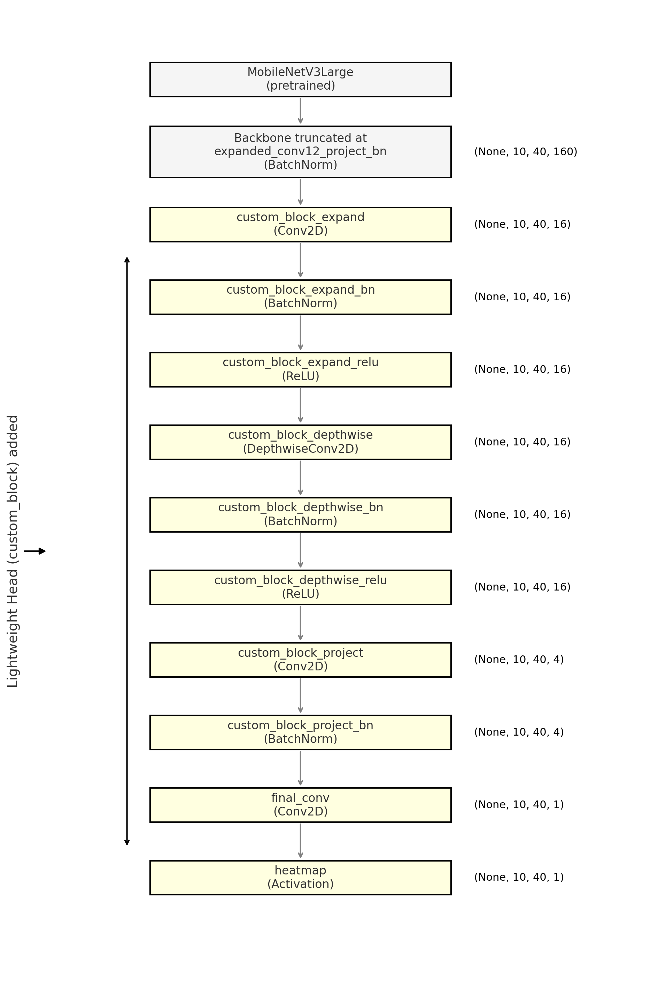

In [8]:
from IPython.display import Image, display

display(Image(filename='architecture_diagram.png', width=650))


##### What layer does it make sense to cut off the backbone?

We truncated the backbone of pretrained MobileNetV3Large model at the layer "expanded_conv_12_project_bn", achieving a spatial resolution of 1/32 with 160 feature channels. Truncating the model at this point reduces complexity compared to deeper layers (960 channels). This allows our lightweight head custom block to efficiently refine features and making this truncation choice optimal:

   - A 1×1 convolution (custom_block_expand) expands channels from 160 to 16.

   - A 3×3 depthwise convolution (custom_block_depthwise) independently filters these 16 channels.

   - A 1×1 convolution (custom_block_project) reduces the channels from 16 to 4.

Final layer is a 1×1 convolution (final_conv) that outputs a single-channel heatmap.

##### How many learnable parameters are okay after the rule of thumb in our case?

As per the rule of thumb the number of learnable parameter should be around 10 training samples per parameter, this dataset contains 31,054 training annotated points so as per the rule we have parameter budget of 3,105 parameters.


##### An f×f convolution with c input and c′ output channels has f²cc′ parameters (bias ignored).What does it mean to keep parameters small?

To keep the parameter small we implemented below 

   - Smaller kernel sizes (1×1 convolutions),

   - Fewer input and output channels to compress from 160 channels down to 4 channels and then at last final layer to 1 channel.

   - Depthwise convolutions (3×3 depthwise) to avoid the cross-channel multiplication.

This architectural decision kept the number of learnable parameter to 2,881 which is within the parameter budget.

##### Think of a block suitable for MobileNetV3: general computations with minimal parameters.

We have implemented the custom_block that is suitable with MobileNetV3Large model and allows general computation with minimal parametrs:

   - Expansion: a 1×1 convolution increases channels from 160 to 16.

   - Depthwise filtering: a 3×3 depthwise convolution processes each channel independently, capturing spatial patterns efficiently.

   - Projection: another 1×1 convolution compresses the channels back from 16 to 4.

This architectural decision keeps the number of learnable parameter to 2,881, providing sufficient computational and it is also within the parameter budget.

##### Use this block once for the low-res version.

we have implemeted the block for the low-res version.

##### What is a good last layer for issuing the heatmap?

The good last layer for generating the heatmap is a straightforward 1×1 convolution (final_conv) which reduces feature channels from 4 to 1, followed by a sigmoid activation. 

This approach maintains the original spatial resolution (10 × 40) while converting channel wise information into pixel-wise, efficiently represents the model's prediction of strawberry locations with good accuracy.

## Aufgabe 10: Erdbeerpraxis ($\sum$ 24P)
In dieser Aufgabe soll das Erdbeerendetektions-CNN aus Aufgabe 9 mit tensorflow/keras implementiert werden.

Dieses Python-Notebook enthält schon Code zum (Herunter-)laden des Datensatzes, zum Anzeigen der Resultate und einzelne Schritte die noch zu implementieren sind.

Es soll MobileNetV3Large als encoder-backbone genutzt werden. Dieses reduziert die Auflösung um Faktor 32 und in der ersten Version des Erkenners soll die Heatmap in dieser Auflösung ausgegeben werden (low-res), so dass keine Decoder-Stage nötig ist. 

Aus dieser Heatmap könnte schlussendlich eine Liste von detektierten und vom Roboter zu greifenden Erdbeeren berechnet werden, dies ist aber nicht mehr Teil der Aufgabe.

Gehe Schritt für Schritt durch das Python-Notebook und ergänze Stellen wo **TODO** steht. Gib das Python-Notebook so ab, dass man an den im Notebook vorgesehenen Stellen Bilder / Ergebnisse sehen kann, so dass ich die Abgabe korrigieren kann ohne es erneut auszuführen.

### Training
Trainiert wird in drei Schritten. Zuerst wird die letzte Schicht so initialisiert, dass sie unabhängig von der Eingabe die a-priori-Verteilung des Datensatzes als Ausgabe gibt. Das ist das beste, was man tun kann, ohne die Eingabe zu betrachten. Dieser Head wird einige Epochen trainiert. Danach wird das ganze Netz nachtrainiert.

Die Musterlösung braucht auf einem Notebook Intel Core i7-1065G7, 1.3GHz, pro Epoche 330s für den Head und 1800s für das Gesamtnetz.

Nach 10 Epochen Training des Heads kommt die Musterlösung auf ein validation-loss von 0.0645.
Nach weiteren 5 Epochen Training des Gesamtnetzes kommt die Musterlösung auf ein validation-loss von 0.0549.

### Wo rechnen?
Die Zeitangaben für die Musterlösung stammen von einem Notebook ohne GPU, also auch mit moderat schnellen Rechnern lässt sich die Aufgabe lösen.
Um CNNs zu trainieren ist ein schneller Rechner aber durchaus hilfreich, am besten mit guter NVIDIA-Grafikkarte. Dafür gibt es mehrere Optionen:
 - Eigener Rechner
    - Auf Windows unterstützt TensorFlow CUDA nicht mehr nativ. Es müsste WSL2 (Linux unter Windows) benutzt werden.
    - Auf ARM-Macs ist die CPU schnell genug. Es gibt theoretisch Metal-Unterstützung, aber die rechnet manchmal falsch und ist daher nicht zu empfehlen.
    - Auf Linux muss TensorFlow mit dem Extra "and-cuda" installiert werden. Das bedeutet, dass in der `environment.yml` die Zeile `- tensorflow==2.18.1` durch `- tensorflow[and-cuda]==2.18.1` ersetzt und anschließend die conda-Umgebung aktualisiert/neu eingerichtet werden muss.
 - u.U. Fachbereichsrechner (nicht geprüft)
 - Google Colab, bei diesem Service hat man Zugriff auf einen Cloud-Rechner mit starker Grafikkarte und  Festplattenspeicher für mehrere Stunden am Stück. Das IPython Notebook wird automatisch in Google Files gespeichert, Daten müssen per Python oder manuell (''Files''-Tab links) zwischen Cloud-Rechner und eigenem Rechner kopiert werden. Achtung: Beim (Zwangs-)Ausloggen gehen alle Daten auf dem Cloud-Rechner verloren.         


In [2]:
import math

# from google.colab import files  # if you use google colab
import tensorflow as tf

if len(tf.config.list_physical_devices("GPU")):
    tf.config.experimental.set_memory_growth(tf.config.list_physical_devices("GPU")[0], True)
import keras
from keras import layers

import resources.uebung_4 as helpers

### Aufgabe 10.1: Datensatz (6P)
Der Datensatz besteht aus einer .zip Datei mit .jpg Bildern und einer .json Datei mit den Dateinamen der Bilder und der jeweiligen Annotation. Die Annotation eines Bildes ist eines Liste von markierten Punkten, jeweils mit x-, y-Koordinate und Klasse in einem dict ("x", "y", "class"). Im Moment gibt es nur die Klasse "Reif" im Datensatz, der Klasseneintrag kann also ignoriert werden.

Um den Datensatz fürs Training zu nutzen, muss die Liste annotierter Punkte in das konvertiert werden, was das CNN ausgibt, also eine Heatmap. Außerdem muss die Heatmap heruntergerechnet werden, weil in diesem Übungszettel das CNN auf 1/32tel-Auflösung ausgibt, also noch keinen Decoder hat. Dafür müssen die dafür notwendigen Operationen (Datei laden - dekodieren - konvertieren - runterrechnen) in ein `tf.data.Dataset` gekapselt werden, das dann später `keras.fit` übergeben wird.

Bereits implementiert ist das Erstellen einer Liste mit Pfaden zu Bildern und den darin annotierten Punkten sowie die Umwandlung der Punktliste in eine Heatmap.
Ihr müsst die `tf.data`-Pipeline drumherum implementieren.


In [3]:
# Load Dataset to disk and split into test and train sets.
# The first run might take some time to download the dataset.
# If dataset has been manually downloaded, set path
test_list, train_list, image_shape = helpers.load_dataset_image_filenames(path=None)

Loaded 1989 files into /home/prakunjpratapsingh/.keras/datasets/erdbeeren19_extracted/erdbeeren19
Loaded images: 1557 training, 390 test
The training set has 31054 annotated strawberries.


I0000 00:00:1749706568.055831   52167 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5915 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [4]:
# TODO: Implement (2P)
def get_image(filename):
    """Loads the image defined by the filepath filename.
    It is called as part of a tf.data pipeline, so it can only use
    TensorFlow operations (in particular tf.io and tf.image).

    :param filename: Path to the image file.
    :return: An image tensor of shape (height, width, 3) with dtype
        `float32` in the range [-1, 1].
    """
    # TODO
    image_bytes = tf.io.read_file(filename)  
    image = tf.image.decode_jpeg(image_bytes, channels=3)  
    image = tf.image.convert_image_dtype(image, tf.float32)  
    image = image * 2.0 - 1.0 
    return image


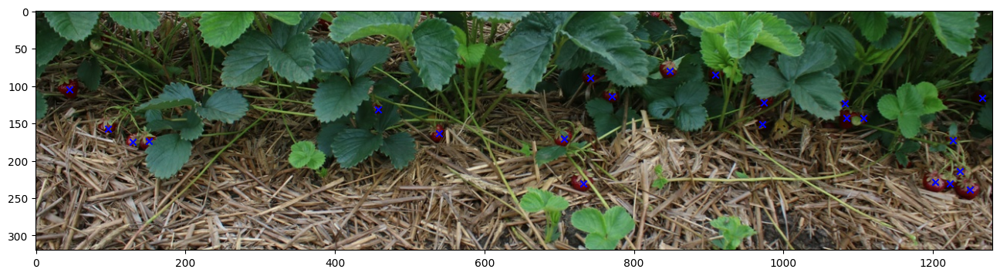

In [5]:
# Function to show images with annotation (either ground-truth or computed by the algorithm)
# The annotation must be given in the same format as one entry of the dataset.
# Test for a random image from the dataset
helpers.show_image_with_gt(get_image, *train_list[0])

In [6]:
# TODO: Implement (2P)
def get_image_and_heatmap(filename, points, resize=helpers.tf_downsample):
    """Transforms a datapoint from filename and annotated points to image and heatmap

    :param filename: Path to the image file.
    :param points: A tensor of annotated points of shape (num_of_points, 2).
    :param resize: Function to be called on the heatmap to resize for lower resolution networks.
    :return: Pair of image tensor (height, width, 3) and heatmap (height//scale, width//scale, 1).
    """
    # Hint: Use helpers.annotation_to_heatmap from resources/uebung_4.py.
    # TODO
    image = get_image(filename) 

    shape = tf.shape(image)[:2]  
    heatmap = helpers.annotation_to_heatmap(points, shape)

    if resize is not None:
        heatmap = resize(heatmap)

    return image, heatmap


I0000 00:00:1749706568.468399   52330 cuda_dnn.cc:529] Loaded cuDNN version 91001


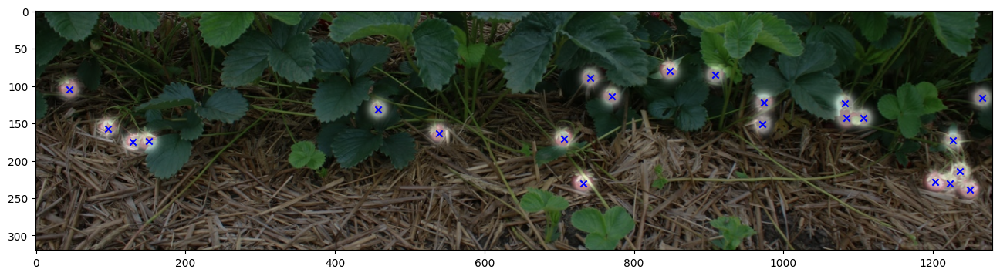

In [7]:
# Show a random entry of the dataset with the annotation converted to a heatmap.
# Use this function to check that get_image_and_heatmap works.
helpers.show_image_with_gt(get_image, *train_list[0], get_image_and_heatmap=get_image_and_heatmap)

In [8]:
# TODO: Implement (2P)
def get_dataset(data_list, batch_size=4):
    """Prepares a tensorflow Dataset pipeline for training
    The result is a `tf.data.Dataset` of batches of pairs of
    (full-res) images and (low-res) heatmaps. The elements of the dataset are
    shuffled such that in each epoch, each element appears in a batch with different
    elements.

    :param data_list: base-data with each element consisting of (filepath, list-of-annotation-points)
    :param batch_size: The number of elements in each batch.
    :return: A `tf.data.Dataset`.
    """
    # Hint: Start with tf.data.experimental.from_list, then apply the necessary transformations.
    # TODO
    def gen():
        for filename, points in data_list:
            yield filename, tf.constant(points, dtype=tf.int32)

    output_signature = (
        tf.TensorSpec(shape=(), dtype=tf.string), 
        tf.TensorSpec(shape=(None, 2), dtype=tf.int32),
    )

    ds = tf.data.Dataset.from_generator(gen, output_signature=output_signature)
    ds = ds.shuffle(buffer_size=len(data_list))
    ds = ds.map(get_image_and_heatmap, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds


Information of the first dataset batch:
X has shape (4, 320, 1280, 3), type <dtype: 'float32'>, range [-1.000..1.000]
y has shape (4, 10, 40, 1), type <dtype: 'float32'>, range [0.000..0.517]


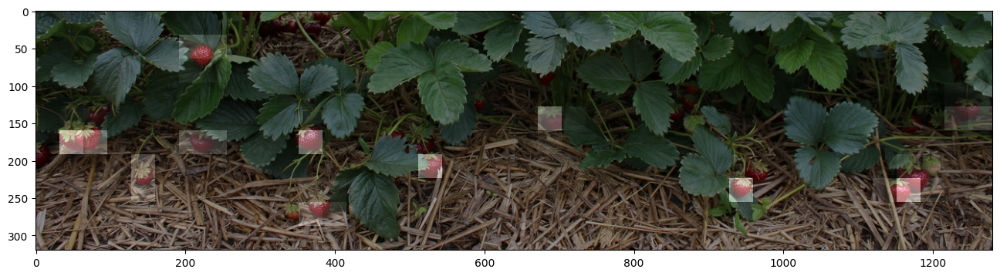

In [9]:
# Creates a tf.data.Dataset object for the loading pipeline for train and test
train_ds = get_dataset(train_list)
test_ds = get_dataset(test_list)
helpers.show_first_entry(train_ds)

In [10]:
# Compute some statistics on the dataset (takes some time, but is cached)
stats = helpers.cache_me("stats.json", lambda: helpers.compute_statistics(train_ds))
print("training set statistics (low resolution):")
for key, value in stats.items():
    print(f"{key}: {value}")
prior_probability = stats["prior probability"]

training set statistics (low resolution):
prior probability: 0.019334161654114723
prior entropy: 0.09543633460998535
average entropy: 0.046799663454294205
percentage over 0.1: 0.06742308288812637
percentage over 0: 0.20561857521533966


### Aufgabe 10.2: Netzwerk (12P)
Implementiere nun das in Aufgabe 9 konzipierte low-res-CNN mit dem MobileNetV3 backbone in der Variable `model`.

MobileNetV3 gibt eine Warnung "`input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default." Das ist kein Problem.

Beachte, dass unsere Heatmap nur einen Kanal hat, wo 0 "keine Erdbeere" und 1 "Erdbeere" bedeutet. Werte dazwischen interpretieren wir als Wahrscheinlichkeit für Erdbeere. Das ist anders als im X-und-O-Beispiel und erfordert Änderungen in Loss, Aktivierung und Initialisierung.

Initialisiere das Netz analog zu Übungszettel 3 so, dass es anfangs fast (vgl. Vorlesung) die Eingabe ignoriert und die dafür optimale Wahrscheinlichkeit ausgibt.

Der MobileNetV3 source code findet sich unter https://github.com/keras-team/keras/blob/v3.9.0/keras/src/applications/mobilenet_v3.py . Das ist hilfreich, wenn Du im eigenen CNN ähnliche Bausteine wie in MobileNetV3 verwenden willst. Der Standardwert des Parameters momentum aus Batchnormalization-Schichten ist allerdings besser für uns als der in MobileNetV3.


In [11]:
# TODO implement (2P)
# An initializer for the bias or batchnorm's beta for the
# layer before the final activation.
def beta_initializer(shape, dtype=None):
    """Returns an initialization for either the beta oder bias parameter directly before the
    final activation. It makes the network (at start) give almost the
    optimal probabilities without considering the input. (confer lecture)"""
    # TODO: Derive what is the input to the final activation required to make the output of that
    # activation prior_probability and consider the remarks in the lecture
    # TODO: implement this formula
    prior_probability = 0.01  
    logit = tf.math.log(prior_probability / (1.0 - prior_probability))
    return tf.fill(shape, logit)


In [12]:
# TODO implement (1P)
# An initializer for the kernel or batchnorm's gamma for the
# layer before the final activation.
def gamma_initializer(shape, dtype=None):
    """Returns an initialization for either the batchnorm's gamma parameter or the
    convolution kernel directly before the final activation. It makes the network (at start)
    give almost the optimal probabilities without considering the input. (confer lecture)."""
    # TODO: Derive what is the input to the final activation required to make the output of that
    # activation priorProbability and consider the remarks in the lecture
    # TODO: implement this formula
    return tf.zeros(shape, dtype=dtype)

In [13]:
# TODO implement (3P)
# Hint: You need to use keras' functional API instead of the sequential as before
# https://www.tensorflow.org/guide/keras/functional_api
# You may add more arguments to this function as needed.
def our_block(x, basename, channels):
    """Our own block of computation layers used several times in the network.
    x is the layer to attach the block to, basename the name of this block, which will be extended
    by layer names. channels is the number of channels in the output (and internal channels are a
    multiple of that). The final layer is returned."""
    # TODO implement
    x = layers.Conv2D(4 * channels, kernel_size=1, padding="same",
                      name=basename + "_expand")(x)
    x = layers.BatchNormalization(name=basename + "_expand_bn")(x)
    x = layers.ReLU(name=basename + "_expand_relu")(x)


    x = layers.DepthwiseConv2D(kernel_size=3, padding="same",
                               name=basename + "_depthwise")(x)
    x = layers.BatchNormalization(name=basename + "_depthwise_bn")(x)
    x = layers.ReLU(name=basename + "_depthwise_relu")(x)

    # Projection to final channels
    x = layers.Conv2D(channels, kernel_size=1, padding="same",
                      name=basename + "_project")(x)
    x = layers.BatchNormalization(name=basename + "_project_bn")(x)
    return x

In [14]:
# TODO implement building the CNN in keras (4P)
# Store the model in the variable `model`
# Place the definition of `model` in this cell
# Place all outputs and calculations one cell below including model.compile
########     ---   Code bitte nicht breiter machen als diese Zeile   ---     ########
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import MobileNetV3Large
import tensorflow as tf

input_tensor = layers.Input(shape=(320, 1280, 3), name="input_image")
# 1) Load backbone without its classification head
backbone = MobileNetV3Large(input_tensor=input_tensor,
                            include_top=False,
                            weights="imagenet")

# 2) Truncate at expanded_conv_12_project_bn (1/32 resolution)
x = backbone.get_layer("expanded_conv_12_project_bn").output
# x.shape == (batch, 10, 40, 160)

# 3) Minimal our_block
x = our_block(x, "custom_block", channels=4)

# 4) Final 1×1 conv → sigmoid heatmap
x = layers.Conv2D(
    1,
    kernel_size=1,
    padding="same",
    name="final_conv",
    kernel_initializer=gamma_initializer,
    bias_initializer=beta_initializer
)(x)

output_tensor = layers.Activation("sigmoid", name="heatmap")(x)
# outputs.shape == (batch, 10, 40, 1)

# 5) Assemble and compile the model
model = Model(inputs=input_tensor, outputs=output_tensor, name="StrawberryHeatmapModel")


/home/prakunjpratapsingh/deeplearning/tf-deeplearningenv/lib/python3.12/site-packages/keras/src/applications/mobilenet_v3.py:517: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


In [16]:
# TODO implement (1P)
# Choose sensible metrics. Several make sense. Note however, that
# keras' accuracy, precision and recall metrics only work with a
# 0/1 ground truth, so not here. Instead we have implemented
# helpers.BinaryAccuracyAt(threshold), helpers.BinaryPrecisionAt(threshold),
# helpers.BinaryRecallAt(threshold), helpers.BinaryIoUAt(threshold)
# In both ground truth and prediction they treat everything >=threshold als yes
# resp. positive. Think a moment about what values for the metric you expect
# given the initialization.
# model.compile(....)
# model.summary()
#######     ---   Code bitte nicht breiter machen als diese Zeile   ---     #######
from tensorflow.keras.optimizers import Adam
import resources.uebung_4 as helpers  
backbone.trainable = False
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[
        helpers.BinaryAccuracyAt(0.5),
        helpers.BinaryPrecisionAt(0.5),
        helpers.BinaryRecallAt(0.5),
        helpers.BinaryIoUAt(0.5)
    ]
)

model.summary()

Model: "StrawberryHeatmapModel"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 320, 1280, │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 320, 1280, │          0 │ input_image[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 160, 640,  │        432 │ rescaling[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 160, 640,  │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 160, 640,  │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 160, 640,  │        144 │ activation[0][0]  │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 160, 640,  │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 160, 640,  │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 160, 640,  │        256 │ re_lu[0][0]       │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 160, 640,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_add   │ (None, 160, 640,  │          0 │ activation[0][0], │
│ (Add)               │ 16)               │            │ expanded_conv_pr… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_ex… │ (None, 160, 640,  │      1,024 │ expanded_conv_ad… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_ex… │ (None, 160, 640,  │        256 │ expanded_conv_1_… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 160, 640,  │          0 │ expanded_conv_1_… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 161, 641,  │          0 │ re_lu_1[0][0]     │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 80, 320,   │        576 │ expanded_conv_1_… │
│ (DepthwiseConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 80, 320,   │        256 │ expanded_conv_1_

 Total params: 1,238,825 (4.73 MB)

 Trainable params: 2,881 (11.25 KB)

 Non-trainable params: 1,235,944 (4.71 MB)

In [17]:
model.evaluate(test_ds, return_dict=True)

I0000 00:00:1749706572.193275   52327 service.cc:152] XLA service 0x7e0040002910 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749706572.193305   52327 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-06-12 07:36:12.332002: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-06-12 07:36:13.459926: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:13.553197: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:16.403800: E exte

     97/Unknown 10s 21ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9985 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0953

2025-06-12 07:36:22.454335: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:22.545139: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:24.947320: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:25.045509: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:25.589609: E external/local_xla/xla/stream_

98/98 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9985 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0954


2025-06-12 07:36:28.033161: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-06-12 07:36:28.033182: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
/home/prakunjpratapsingh/deeplearning/tf-deeplearningenv/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'binary_IoU@0.5': 0.0,
 'binary_accuracy@0.5': 0.9984294772148132,
 'binary_precision@0.5': 0.0,
 'binary_recall@0.5': 0.0,
 'loss': 0.09823817759752274}

In [18]:
# Train the low-res-net keeping the backbone fixed
my_epoch = 0
if my_epoch > 0:
    model.load_weights(f"strawberry-L-{my_epoch:02}.weights.h5")  # load a previous checkpoint
if my_epoch < 10:
    model.fit(
        train_ds,
        initial_epoch=my_epoch,
        epochs=10,
        validation_data=test_ds,
        callbacks=[helpers.CheckpointSaver("L")],
        # callbacks=[tf.keras.callbacks.TensorBoard(log_dir="../logs", profile_batch=[2,3])]
    )
    my_epoch = 10

# files.download("strawberry-L-02.weights.h5") # download weights from e.g. google-colab to local machine

Epoch 1/10
    389/Unknown 15s 22ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9984 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0973

2025-06-12 07:36:44.559406: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:44.645402: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:46.910715: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:47.007274: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:36:47.548145: E external/local_xla/xla/stream_

    390/Unknown 23s 40ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9984 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0973

2025-06-12 07:36:50.591802: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]


390/390 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9984 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0973 - val_binary_IoU@0.5: 0.0000e+00 - val_binary_accuracy@0.5: 0.9984 - val_binary_precision@0.5: 0.0000e+00 - val_binary_recall@0.5: 0.0000e+00 - val_loss: 0.0955
Epoch 2/10
390/390 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9985 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0931

2025-06-12 07:37:01.919436: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]


390/390 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - binary_IoU@0.5: 0.0000e+00 - binary_accuracy@0.5: 0.9985 - binary_precision@0.5: 0.0000e+00 - binary_recall@0.5: 0.0000e+00 - loss: 0.0931 - val_binary_IoU@0.5: 0.0000e+00 - val_binary_accuracy@0.5: 0.9984 - val_binary_precision@0.5: 0.0000e+00 - val_binary_recall@0.5: 0.0000e+00 - val_loss: 0.0893
Epoch 3/10
390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - binary_IoU@0.5: 5.7914e-04 - binary_accuracy@0.5: 0.9984 - binary_precision@0.5: 0.1251 - binary_recall@0.5: 5.8084e-04 - loss: 0.0878 - val_binary_IoU@0.5: 0.0077 - val_binary_accuracy@0.5: 0.9984 - val_binary_precision@0.5: 0.1250 - val_binary_recall@0.5: 0.0082 - val_loss: 0.0829
Epoch 4/10
386/390 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - binary_IoU@0.5: 0.0087 - binary_accuracy@0.5: 0.9983 - binary_precision@0.5: 0.1335 - binary_recall@0.5: 0.0093 - loss: 0.0837

2025-06-12 07:37:27.549094: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]


390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - binary_IoU@0.5: 0.0087 - binary_accuracy@0.5: 0.9983 - binary_precision@0.5: 0.1332 - binary_recall@0.5: 0.0093 - loss: 0.0837 - val_binary_IoU@0.5: 0.0105 - val_binary_accuracy@0.5: 0.9982 - val_binary_precision@0.5: 0.0682 - val_binary_recall@0.5: 0.0122 - val_loss: 0.0811
Epoch 5/10
389/390 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - binary_IoU@0.5: 0.0130 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0778 - binary_recall@0.5: 0.0154 - loss: 0.0825

2025-06-12 07:37:40.079666: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:37:40.079719: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786
2025-06-12 07:37:42.655568: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:37:42.655622: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786


390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - binary_IoU@0.5: 0.0131 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0779 - binary_recall@0.5: 0.0154 - loss: 0.0825 - val_binary_IoU@0.5: 0.0191 - val_binary_accuracy@0.5: 0.9980 - val_binary_precision@0.5: 0.0800 - val_binary_recall@0.5: 0.0245 - val_loss: 0.0800
Epoch 6/10
390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - binary_IoU@0.5: 0.0175 - binary_accuracy@0.5: 0.9982 - binary_precision@0.5: 0.0811 - binary_recall@0.5: 0.0218 - loss: 0.0813 - val_binary_IoU@0.5: 0.0162 - val_binary_accuracy@0.5: 0.9981 - val_binary_precision@0.5: 0.0725 - val_binary_recall@0.5: 0.0204 - val_loss: 0.0793
Epoch 7/10
390/390 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - binary_IoU@0.5: 0.0191 - binary_accuracy@0.5: 0.9982 - binary_precision@0.5: 0.0879 - binary_recall@0.5: 0.0238 - loss: 0.0804 - val_binary_IoU@0.5: 0.0192 - val_binary_accuracy@0.5: 0.9980 - val_binary_precision@0.5: 0.0811 - val_binary_recall@0.5: 0.0245 - val_loss: 0.0788


2025-06-12 07:38:07.728221: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:38:07.728252: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786


Epoch 8/10
387/390 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - binary_IoU@0.5: 0.0161 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0670 - binary_recall@0.5: 0.0205 - loss: 0.0794

2025-06-12 07:38:18.235154: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]


390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - binary_IoU@0.5: 0.0161 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0673 - binary_recall@0.5: 0.0206 - loss: 0.0794 - val_binary_IoU@0.5: 0.0199 - val_binary_accuracy@0.5: 0.9981 - val_binary_precision@0.5: 0.0952 - val_binary_recall@0.5: 0.0245 - val_loss: 0.0784
Epoch 9/10
388/390 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - binary_IoU@0.5: 0.0189 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0889 - binary_recall@0.5: 0.0234 - loss: 0.0804

2025-06-12 07:38:30.718848: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:38:30.718905: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786


390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - binary_IoU@0.5: 0.0189 - binary_accuracy@0.5: 0.9981 - binary_precision@0.5: 0.0889 - binary_recall@0.5: 0.0234 - loss: 0.0804 - val_binary_IoU@0.5: 0.0256 - val_binary_accuracy@0.5: 0.9980 - val_binary_precision@0.5: 0.1053 - val_binary_recall@0.5: 0.0327 - val_loss: 0.0782
Epoch 10/10
390/390 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - binary_IoU@0.5: 0.0263 - binary_accuracy@0.5: 0.9982 - binary_precision@0.5: 0.1074 - binary_recall@0.5: 0.0337 - loss: 0.0787 - val_binary_IoU@0.5: 0.0261 - val_binary_accuracy@0.5: 0.9981 - val_binary_precision@0.5: 0.1159 - val_binary_recall@0.5: 0.0327 - val_loss: 0.0778


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


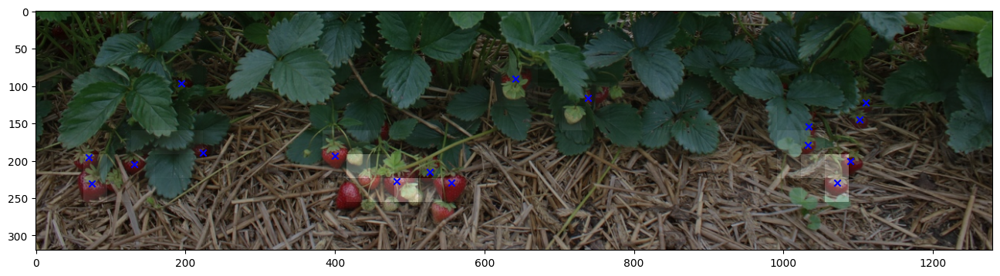

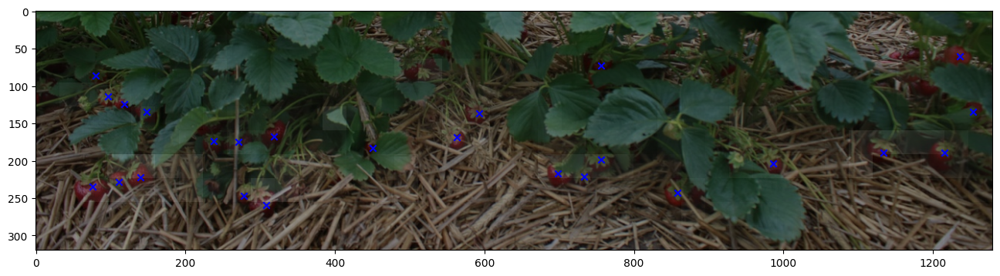

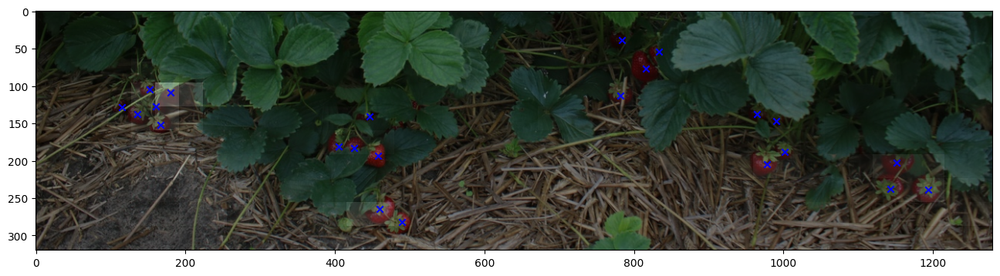

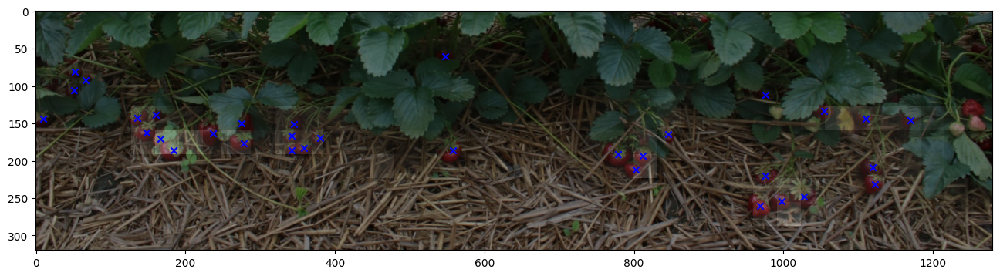

In [19]:
# Use this to visualize results
# It shows the input image (background), the predicted heatmap (white "fog" in foreground)
# and the ground-truth (blue crosses)
helpers.visualize_results(get_image, model, test_list[:4], exaggerate=1)

In [20]:
# TODO: implement (1P)
# Switch whole network to trainable.
# Mobilenet happens to have a very slow moving average in the
# BatchNorm-Layer. Set the momentum parameter of every batchnorm
# layer to 0.99.
# Remember to call compile again.
# 1. Unfreeze all layers
# model.trainable = True
backbone.trainable = True

# 2. Update BatchNorm momentum to 0.99
for layer in model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.momentum = 0.99

# 3. Recompile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), 
    loss="binary_crossentropy",
    metrics=[
        helpers.BinaryAccuracyAt(0.5),
        helpers.BinaryPrecisionAt(0.5),
        helpers.BinaryRecallAt(0.5),
        helpers.BinaryIoUAt(0.5),
    ]
)

In [21]:
# Train the low-res-net including the backbone
model.fit(
    train_ds,
    initial_epoch=my_epoch,
    epochs=15,
    validation_data=test_ds,
    callbacks=[helpers.CheckpointSaver("L")],
    # callbacks=[tf.keras.callbacks.TensorBoard(log_dir="../logs", profile_batch=[2,3])]
)
my_epoch = 15
# files.download("strawberry-L-00.weights.h5") # download weights from e.g. google-colab to local machine

Epoch 11/15


2025-06-12 07:39:03.718783: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:03.827520: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:05.160825: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:05.259339: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:06.048016: E external/local_xla/xla/stream_

    388/Unknown 50s 52ms/step - binary_IoU@0.5: 0.0167 - binary_accuracy@0.5: 0.9980 - binary_precision@0.5: 0.0651 - binary_recall@0.5: 0.0238 - loss: 0.0814

2025-06-12 07:39:42.647926: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:42.752355: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:39:45.814750: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:382] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead. You may try smaller batch sizes to observe the performance impact. Set TF_ENABLE_GPU_GARBAGE_COLLECTION=false if you'd like to 

390/390 ━━━━━━━━━━━━━━━━━━━━ 72s 107ms/step - binary_IoU@0.5: 0.0168 - binary_accuracy@0.5: 0.9980 - binary_precision@0.5: 0.0653 - binary_recall@0.5: 0.0241 - loss: 0.0814 - val_binary_IoU@0.5: 0.0000e+00 - val_binary_accuracy@0.5: 0.9984 - val_binary_precision@0.5: 0.0000e+00 - val_binary_recall@0.5: 0.0000e+00 - val_loss: 0.1002
Epoch 12/15
390/390 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - binary_IoU@0.5: 0.0639 - binary_accuracy@0.5: 0.9974 - binary_precision@0.5: 0.1230 - binary_recall@0.5: 0.1170 - loss: 0.0665

2025-06-12 07:40:24.042280: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:40:24.042318: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786


390/390 ━━━━━━━━━━━━━━━━━━━━ 23s 58ms/step - binary_IoU@0.5: 0.0639 - binary_accuracy@0.5: 0.9974 - binary_precision@0.5: 0.1230 - binary_recall@0.5: 0.1170 - loss: 0.0665 - val_binary_IoU@0.5: 0.0490 - val_binary_accuracy@0.5: 0.9973 - val_binary_precision@0.5: 0.0973 - val_binary_recall@0.5: 0.0898 - val_loss: 0.0635
Epoch 13/15
390/390 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - binary_IoU@0.5: 0.0646 - binary_accuracy@0.5: 0.9976 - binary_precision@0.5: 0.1449 - binary_recall@0.5: 0.1036 - loss: 0.0648 - val_binary_IoU@0.5: 0.0889 - val_binary_accuracy@0.5: 0.9974 - val_binary_precision@0.5: 0.1633 - val_binary_recall@0.5: 0.1633 - val_loss: 0.0622
Epoch 14/15
390/390 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - binary_IoU@0.5: 0.0727 - binary_accuracy@0.5: 0.9979 - binary_precision@0.5: 0.1757 - binary_recall@0.5: 0.1106 - loss: 0.0632

2025-06-12 07:41:10.515297: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:41:10.515333: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786


390/390 ━━━━━━━━━━━━━━━━━━━━ 23s 58ms/step - binary_IoU@0.5: 0.0727 - binary_accuracy@0.5: 0.9979 - binary_precision@0.5: 0.1757 - binary_recall@0.5: 0.1105 - loss: 0.0632 - val_binary_IoU@0.5: 0.0850 - val_binary_accuracy@0.5: 0.9980 - val_binary_precision@0.5: 0.2320 - val_binary_recall@0.5: 0.1184 - val_loss: 0.0614
Epoch 15/15
390/390 ━━━━━━━━━━━━━━━━━━━━ 23s 58ms/step - binary_IoU@0.5: 0.0480 - binary_accuracy@0.5: 0.9979 - binary_precision@0.5: 0.1431 - binary_recall@0.5: 0.0671 - loss: 0.0634 - val_binary_IoU@0.5: 0.0728 - val_binary_accuracy@0.5: 0.9982 - val_binary_precision@0.5: 0.2785 - val_binary_recall@0.5: 0.0898 - val_loss: 0.0610


### Aufgabe 10.3: Diskussion (6P)

**TODO:** Beschreibe, analysiere und diskutiere das Ergebnis. Betrachte dabei quantitative Größen, also z.B. den Werteverlauf der Lossfunktion. Beschreibe diese Zahlen nicht nur, sondern ordne sie ein und vergleiche sie, um zu einer Bewertung zu kommen.

Betrachte auch qualitative Ergebnisse, indem Du Beispielbilder und deren Ausgabe anschaust und analysiert. Was ist bemerkenswert? Wo versagt das Netz? Woran könnte das liegen?

98/98 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - binary_IoU@0.5: 0.0921 - binary_accuracy@0.5: 0.9983 - binary_precision@0.5: 0.2826 - binary_recall@0.5: 0.1201 - loss: 0.0606
{'binary_IoU@0.5': 0.07284767925739288, 'binary_accuracy@0.5': 0.9982051253318787, 'binary_precision@0.5': 0.27848100662231445, 'binary_recall@0.5': 0.08979591727256775, 'loss': 0.0610058419406414}


2025-06-12 07:41:36.670121: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2025-06-12 07:41:36.670159: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 11818988894577790998
2025-06-12 07:41:36.670187: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 10160473280477706786
2025-06-12 07:41:38.500487: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:41:38.600491: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-12 07:41:40.0

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


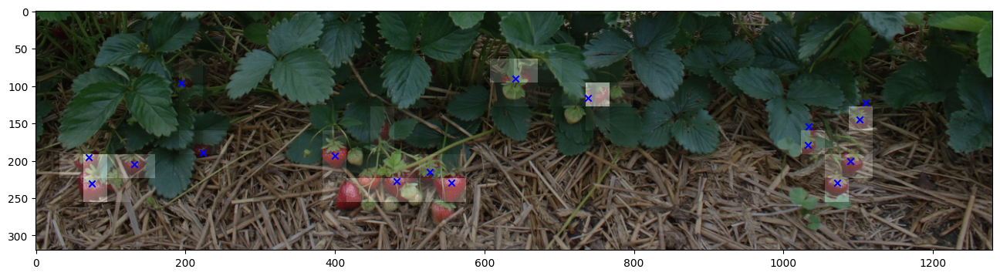

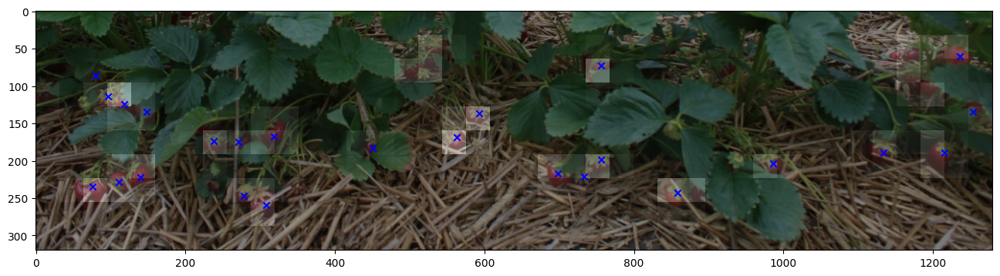

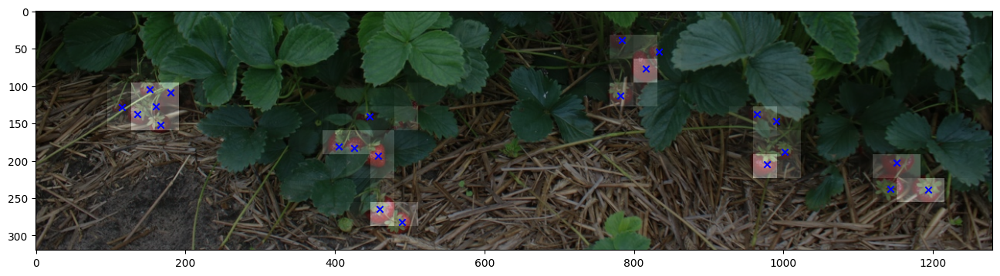

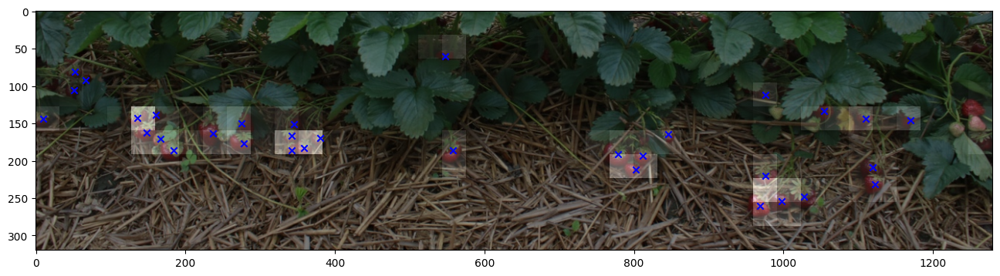

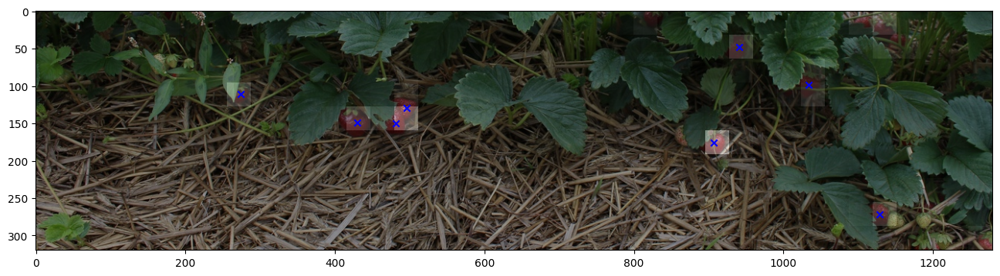

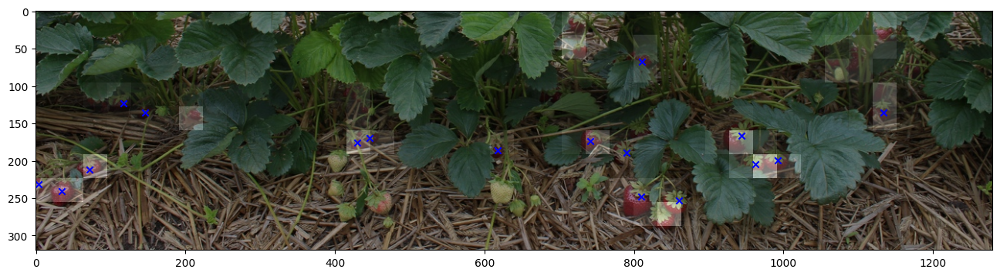

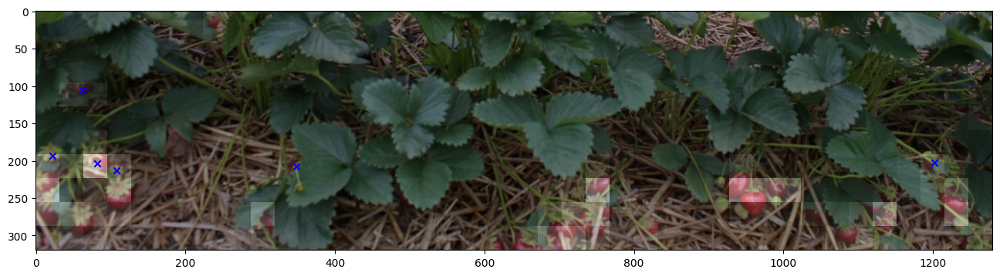

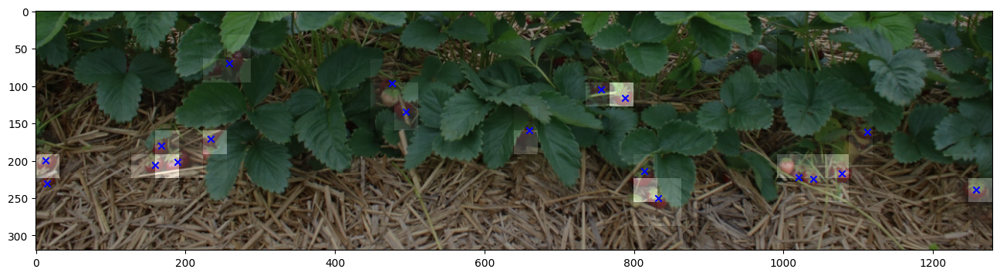

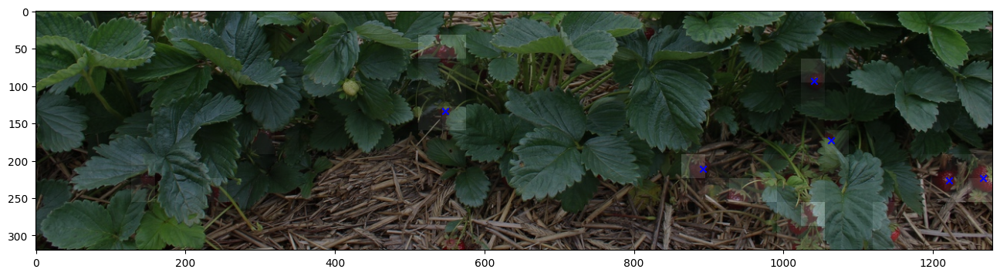

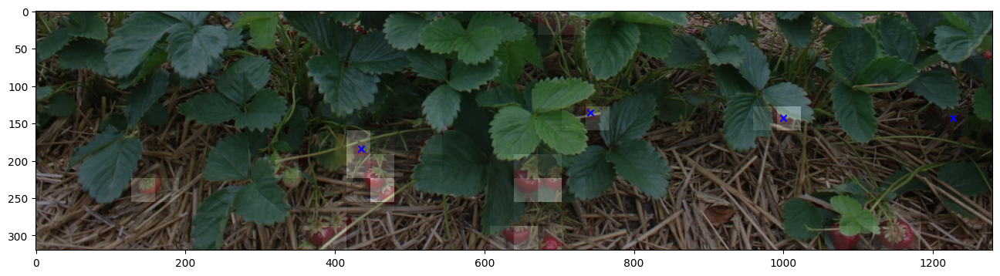

In [22]:
# Use this to visualize results
# It shows the input image (background), the predicted heatmap (white "fog" in foreground)
# and the ground-truth (blue crosses)
print(model.evaluate(test_ds, return_dict=True))
helpers.visualize_results(get_image, model, test_list[:10], exaggerate=1)

**TODO:** Discuss

||| - - - - - - - - - - - - - - Nicht breiter machen als diese Zeile - - - - - - - - - - - - - - - - - - |||



#### Quantitative Analysis:


##### Head-only Training (Epochs 1 to 10):

- The head only training results in a loss of 0.0787, it indicates that the head (without fine tuning the backbone) achieves moderate performance.

##### Full Model Training(Epochs 11 to 15):

- After unfreezing all the layers and fine tuning the entire network for five more epochs, the loss further drops to 0.0634, indicates significant improvement of 19.5 % compared to head only training.

##### Final Evaluation:

- The final evaluation loss of 0.0606 indicates there is no overfitting and model continues to improve.

The overall output shows that architectural design effectively balances the model complexity with generalization ability given the number of trainiable parameter used 2,881 (below parameter budget of 3,105 as per thumb rule) and allowing deep network layers to effectively adapt to predict the presence of strawberry.



#### Qualitative Analysis:

##### Head-only Training (Epochs 1 to 10):

- The "fog" (predicted areas) are less precise and does not perfectly align with ground truths (blue crosses), especially for berries at edges or partly covered by leaves. this shows that it only captures general areas with strawberries but struggles to predict exact locations.


##### Full Model Training(Epochs 11 to 15):


- The "fog" (predicted areas) are more clear and visible in the predicted heatmaps. And also better aligned with the ground truth annotations. The network confidently predicts clear blobs around the actual berries, this shows significant improvement compared to earlier training epochs.


#### What is Remarkable?

##### Efficient Parameter Utilization: 

- The implemented lightweight head proves to be effective as achieving a substantial improvement in predictions using only 2,881 parameters is remarkable given the low-resolution output (10×40).

##### Significant Improvement with Minimal Additional Training: 

- With only 5 epochs of fine-tuning the backbone, a notable drop in loss (from 0.0787 to 0.0634) was achieved, this clearly indicate the effectiveness of deeper fine tuning.

##### Balance Model complexity with Generalization: 

- Final loss of 0.0606 shows the model ability to generalize effectively to the unseen data, this model predicts the presence of strawberry with good accuracy despite a small parameter budget.

##### Where Does the Network Fail?

- Small or Distant strawberries: The model struggles with berries that are small or located at distance.

- Partially covered strawberries: The model struggles to predict strawberries that are partially hidden by leaves or located near edges.

- Adjacent Strawberries: Closely placed strawberries are sometimes merged into a single predicted blob due to limited spatial resolution.

#### Possible Reasons for Failures:

- Resolution Constraints: The models coarse spatial resolution (1/32 of input image size) limits to capture fine details so it affects the precision on small or partially covered strawberries.

- Parameter Budget: The small parameter count (2,881 parameters) restricts the model to learn complex patterns , so model struggles to differentiate between closely spaced or partly covered berries.

- Training Data Variability: Limited examples training data with different variation such as small, distant, or partly covered strawberries also resticts the model to generalize properly.